# ***Cognifyz INTERNSHIP PROGRAM Data Science***


## ***Task 3***

Geospatial Analysis

Visualize the locations of restaurants on a
map using latitude and longitude
information.

Analyze the distribution of restaurants
across different cities or countries.

Determine if there is any correlation
between the restaurant's location and its
rating.

#IMPORTING LIBRARIES



pandas (import pandas as pd): For handling structured data with DataFrames.

numpy (import numpy as np): For numerical operations on arrays and matrices.

matplotlib (import matplotlib.pyplot as plt): For creating static visualizations.

seaborn (import seaborn as sb): For creating attractive statistical visualizations.

Setting display options (pd.set_option): Adjusts options to display all columns and limit rows to 150 for better data exploration.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb


#display all columns and rows of the dataframe
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows', 150)

IMPORTING DATA SET

Upload a file from your local machine to your Colab environment

uploaded = files.upload()

Download a file from your Colab environment to your local machine

files.download('example.txt')

In [2]:
from google.colab import files
raw= files.upload()


Saving Dataset .csv to Dataset .csv


REVIEWING THE DATASET

In [3]:
rdata=pd.read_csv('Dataset .csv')

SHALLOW COPYING

In [4]:
df=rdata.copy()

'Restaurant ID': Unique identifier for each restaurant.

'Restaurant Name': Name of the restaurant.

'Country Code': Code representing the country where the restaurant is located.

'City': City where the restaurant is situated.

'Address': Street address of the restaurant.

'Locality': Specific area or neighborhood where the restaurant is located.

'Locality Verbose': Detailed information about the locality.

'Longitude': Geographic coordinate specifying the east-west position of the restaurant.

'Latitude': Geographic coordinate specifying the north-south position of the restaurant.

'Cuisines': Types of cuisines offered by the restaurant.

'Average Cost for two': Average cost for two people dining at the restaurant.

'Currency': Currency used for pricing.

'Has Table booking': Indicates whether the restaurant accepts table bookings.

'Has Online delivery': Indicates whether the restaurant offers online delivery services.

'Is delivering now': Indicates whether the restaurant is currently delivering orders.

'Switch to order menu': A feature that allows users to switch to the menu for ordering.

'Price range': Numeric representation of the price range for the restaurant.

'Aggregate rating': Overall rating for the restaurant, possibly an average of user ratings.

'Rating color': Color code associated with the rating for visualization purposes.

'Rating text': Descriptive text associated with the rating (e.g., Excellent, Good, Average).

'Votes': Number of votes or reviews received by the restaurant.

In [5]:
import folium
from folium.plugins import MarkerCluster

# Create a base map centered at the mean latitude and longitude
base_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

# Create a MarkerCluster to group restaurant markers
marker_cluster = MarkerCluster().add_to(base_map)

# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

# Save the map as an HTML file
base_map.save('restaurant_map.html')

# Display the map
base_map


We create a base map centered at the mean latitude and longitude of all restaurants using folium.Map.

A MarkerCluster is used to group restaurant markers for better visualization.

We iterate through each restaurant in the DataFrame, adding a marker for each one with its latitude, longitude, and restaurant name.

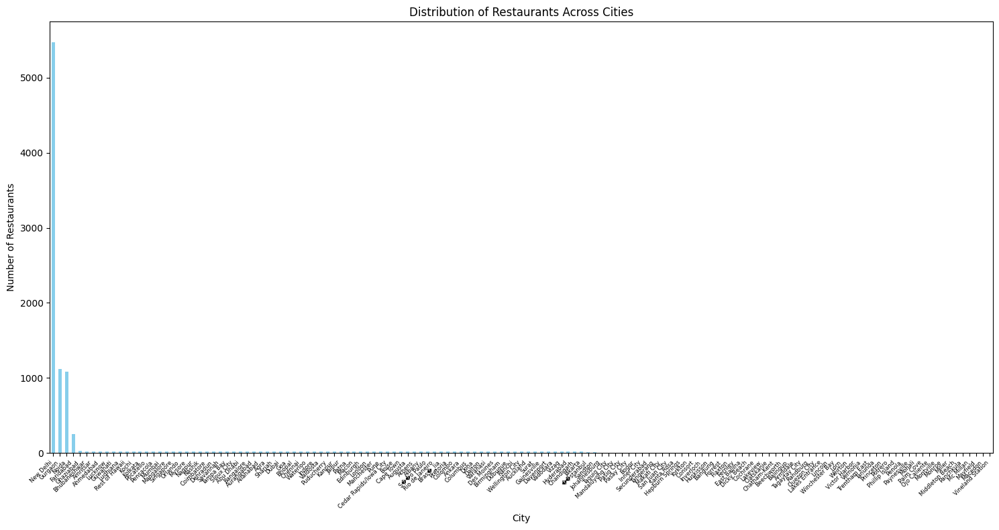

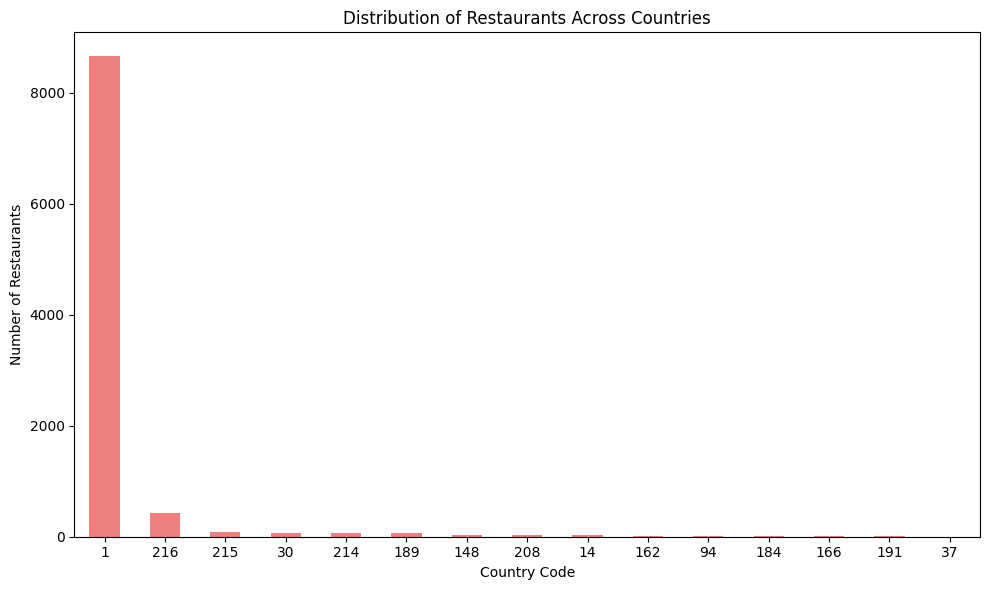

In [8]:
# Distribution of restaurants across different cities
city_distribution = df['City'].value_counts()

# Plot the distribution of restaurants across cities
plt.figure(figsize=(15, 8))
city_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Restaurants Across Cities')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45,fontsize=6, ha='right')  # Adjust rotation for better readability
plt.tight_layout()  # Automatically adjusts subplot parameters for better layout
plt.show()

# Distribution of restaurants across different countries
country_distribution = df['Country Code'].value_counts()

# Plot the distribution of restaurants across countries
plt.figure(figsize=(10, 6))
country_distribution.plot(kind='bar', color='lightcoral')
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=0)  # Adjust rotation if needed
plt.tight_layout()  # Automatically adjusts subplot parameters for better layout
plt.show()


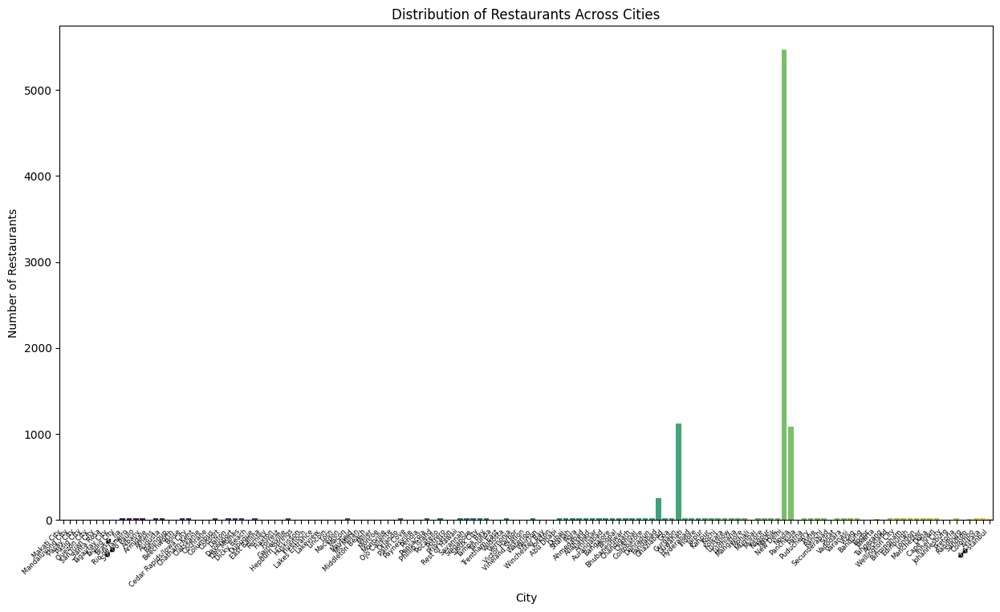

In [10]:
# Distribution of restaurants across different cities
plt.figure(figsize=(15, 8))
sb.countplot(x='City', data=df, palette='viridis')
plt.title('Distribution of Restaurants Across Cities')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45,fontsize=6, ha='right')  # Adjust rotation for better readability
plt.show()

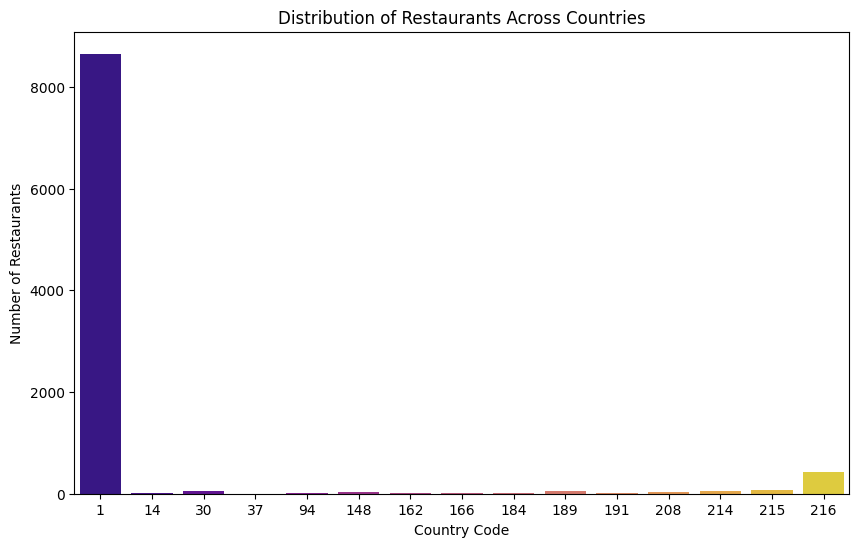

In [12]:
# Distribution of restaurants across different countries
plt.figure(figsize=(10, 6))
sb.countplot(x='Country Code', data=df, palette='plasma')
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.show()

<ipython-input-16-1321c06af796>:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sb.scatterplot(x='City', y='Aggregate rating', data=df, palette='coolwarm')


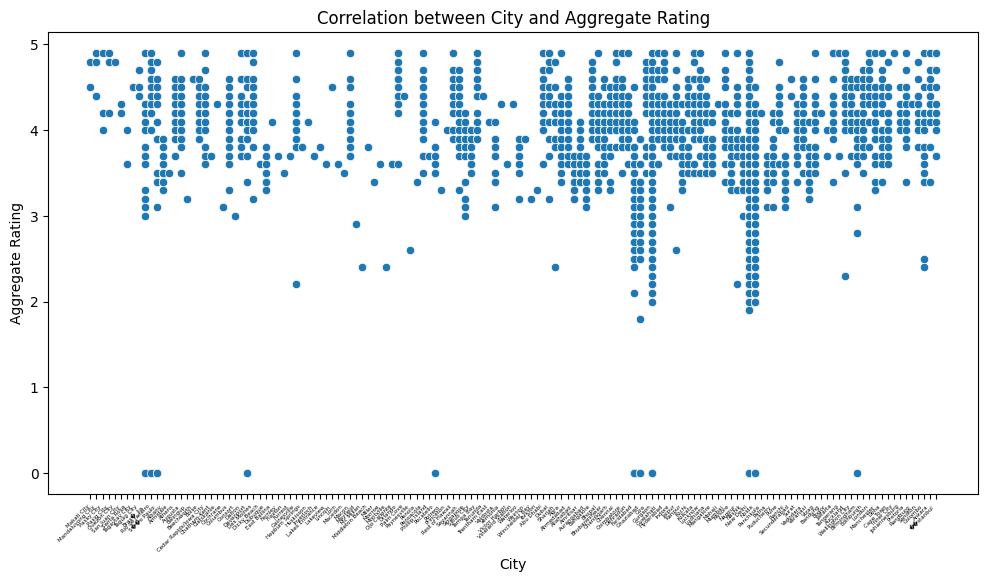

<ipython-input-16-1321c06af796>:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sb.scatterplot(x='Country Code', y='Aggregate rating', data=df, palette='coolwarm')


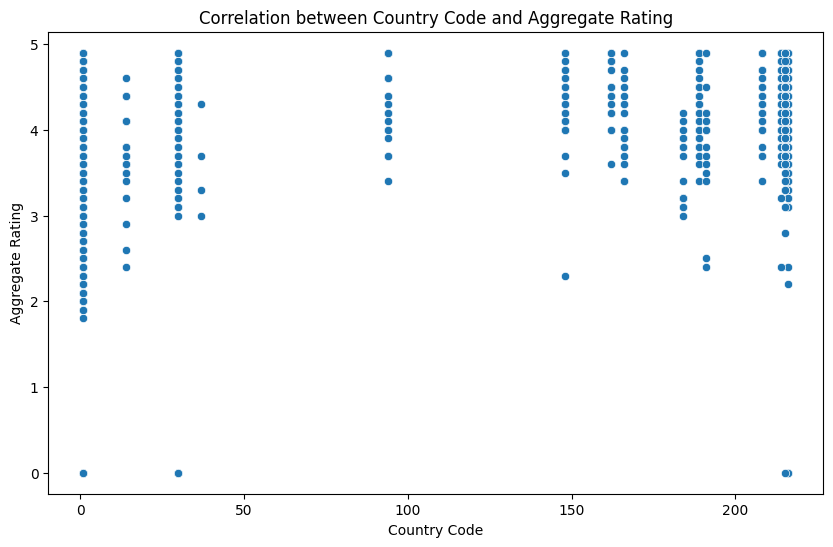

Correlation coefficient between City and Aggregate Rating:
                  Aggregate rating
Aggregate rating               1.0

Correlation coefficient between Country Code and Aggregate Rating:
                  Aggregate rating
Aggregate rating               1.0


In [16]:
# Correlation between restaurant's location (City, Country) and its rating
plt.figure(figsize=(12, 6))
sb.scatterplot(x='City', y='Aggregate rating', data=df, palette='coolwarm')
plt.title('Correlation between City and Aggregate Rating')
plt.xlabel('City')
plt.ylabel('Aggregate Rating')
plt.xticks(rotation=45, fontsize=4, ha='right')
plt.show()

plt.figure(figsize=(10, 6))
sb.scatterplot(x='Country Code', y='Aggregate rating', data=df, palette='coolwarm')
plt.title('Correlation between Country Code and Aggregate Rating')
plt.xlabel('Country Code')
plt.ylabel('Aggregate Rating')
plt.show()

# Calculate correlation coefficient
correlation_city_rating = df[['City', 'Aggregate rating']].groupby('City').mean()
correlation_country_rating = df[['Country Code', 'Aggregate rating']].groupby('Country Code').mean()

print("Correlation coefficient between City and Aggregate Rating:")
print(correlation_city_rating.corr())

print("\nCorrelation coefficient between Country Code and Aggregate Rating:")
print(correlation_country_rating.corr())
